In [45]:
%matplotlib inline

%load_ext autoreload
%autoreload 2

from pathlib import Path
import pickle
import h5py

import numpy as np
import pandas as pd

from qvc.hubble.hubble_utils import populate_spectra_fit
from qvc.light_curve.multiband_fit_utils import flatten_flat_samples_per_band, process_samples


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
%matplotlib inline

%load_ext autoreload
%autoreload 2

RESULTS_DIR = Path("results")
DATA_DIR = RESULTS_DIR / "data"
SAMPLES_DIR = RESULTS_DIR / "samples"

# Keep the pickle run and sample directory matched.
sample_run = "jan1_single_chisq_carma_mixscalar_nozband_highertaufastlim_removemix_fixband_lagblrband_chisq_spl_nofhost_bwb_lmc-6_N1w1000s200t14ch4"
pkl_file = DATA_DIR / f"{sample_run}.h5.pkl"
sample_dir = SAMPLES_DIR / sample_run
spectra_fit_csv = DATA_DIR / "jaxqsofit_mar15c.csv"

if not pkl_file.exists():
    raise FileNotFoundError(f"Missing pickle file: {pkl_file}")
if not spectra_fit_csv.exists():
    raise FileNotFoundError(f"Missing spectra-fit CSV: {spectra_fit_csv}")

with open(pkl_file, "rb") as f:
    quasar_list = pickle.load(f)
print("Number of quasars loaded:", len(quasar_list))
print("Sample directory:", sample_dir)
print("Spectra-fit CSV:", spectra_fit_csv)

df = pd.DataFrame(quasar_list)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Number of quasars loaded: 13050


In [47]:
df = populate_spectra_fit(df, [str(spectra_fit_csv)])

df_agn = df[(~df['BC'].astype(bool)) & (~df['decomp_host'].astype(bool)) & (df['iron_frac'] < 2.0)].copy()

Loading spectra fit CSV (1/1): results/data/nov12a_11c_single_scratch_nov10a_carma_removemix_fixmeanband_no1pluszflux2L_freeiron_mc50_best.csv
Length of merged DataFrame (best=True): 13050


/Users/colinburke/miniforge3/envs/jaxgpu/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/colinburke/miniforge3/envs/jaxgpu/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/colinburke/miniforge3/envs/jaxgpu/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/colinburke/miniforge3/envs/jaxgpu/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [48]:
df_agn

,object_id,LOGL5100,LOGL5100_ERR,LOGLBOL,LOGLBOL_ERR,alpha_agn,alpha_agn_acf,alpha_agn_err,alpha_agn_ess,alpha_agn_per_chain_variance,...,lam_rf_max,log_redchi,log_ebv_fs,log_euv_fs,dm_red,dm_red_err,log_reddening_integral,log_conti_a_0,alpha_nu,alpha_nu_err
0,1446436,0.000000,-1.000000,46.106453,0.010754,-1.520148,"[1.0, 0.016683227313473138, 0.0336658737691982...",0.279117,726.811399,"[0.07395039608473553, 0.0847721542091781, 0.09...",...,3300.958252,0.228535,NaN,NaN,0.0,0.029114,NaN,-9.0,-1.288679,0.006126
1,1391164,0.000000,-1.000000,45.739251,0.006004,-1.518897,"[1.0, -0.12620071086702972, -0.044494010987899...",0.301505,800.000000,"[0.09308506083384359, 0.10788100040546007, 0.1...",...,4237.627930,0.164772,NaN,NaN,0.0,0.025460,NaN,-9.0,-0.480687,0.012543
3,1393218,0.000000,-1.000000,46.390891,0.013278,-1.517803,"[1.0000000000000002, -0.020336533023105133, -0...",0.302495,800.000000,"[0.07409588272268039, 0.10489452127185042, 0.1...",...,2408.324707,0.107712,NaN,NaN,0.0,0.037602,NaN,-9.0,-0.567935,0.014052
4,1442749,0.000000,-1.000000,45.544206,0.005787,-1.497540,"[1.0, -0.11011445416114934, 0.0942609829726324...",0.295610,800.000000,"[0.08803733708433487, 0.10783058416838698, 0.0...",...,5092.812988,0.085597,NaN,NaN,0.0,0.038956,NaN,-9.0,-1.209684,0.012263
5,1439445,0.000000,-1.000000,46.547468,0.002767,-1.523372,"[1.0, -0.02846479364568518, 0.0213550309799218...",0.302108,800.000000,"[0.09246190461184435, 0.08941785228512288, 0.1...",...,2943.831055,0.254733,NaN,NaN,0.0,0.056767,NaN,-9.0,-0.764414,0.003949
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13044,1464912,0.000000,-1.000000,46.362922,0.003617,-1.512401,"[1.0, 0.07483870281246992, 0.02034579511232548...",0.321127,672.060515,"[0.09980605330616522, 0.08888430841917158, 0.1...",...,3212.634033,0.249340,NaN,NaN,0.0,0.036644,NaN,-9.0,-0.647613,0.005781
13045,1414544,0.000000,-1.000000,46.081353,0.007889,-1.529249,"[0.9999999999999999, -0.06100855137614332, 0.1...",0.306050,612.371135,"[0.08956012833007476, 0.09647031161644971, 0.0...",...,3421.248291,0.206011,NaN,NaN,0.0,0.051667,NaN,-9.0,-0.504360,0.028889
13046,1448406,0.000000,-1.000000,46.328272,0.002311,-1.502444,"[1.0, -0.06724054819364067, 0.0482147690534417...",0.315470,800.000000,"[0.10658836372308239, 0.09810033630336686, 0.1...",...,4324.797852,0.600123,NaN,NaN,0.0,0.030876,NaN,-9.0,-0.632820,0.004242
13048,1450952,44.353996,0.018098,45.320607,0.018098,-1.494673,"[1.0, -0.19875740337135123, 0.0563075035041733...",0.308544,800.000000,"[0.0940600903257668, 0.09146183468244064, 0.10...",...,5779.781738,0.034526,NaN,NaN,0.0,0.037099,NaN,-9.0,-0.862189,0.019764


In [49]:
# Load samples

def load_sample(object_id, sample_dir=sample_dir):
    samples = {}
    pattern = f"{object_id}_*.h5"
    print("Looking for files matching:", sample_dir / pattern)

    file_paths = sorted(Path(sample_dir).glob(pattern))
    if len(file_paths) != 1:
        print("Error: Expected one file, found", len(file_paths))
        return None
    file_path = file_paths[0]

    with h5py.File(file_path, "r") as hdf:
        for key in hdf.keys():
            samples[key] = np.array(hdf[key])

    print(f"Loaded {len(samples)} datasets from {file_path}")
    return samples


In [79]:
def log_prior(theta, z, a=np.log(2.0), b=np.log(5000.0)):
    a = np.log(np.exp(a)*(1 + z))
    b = np.log(np.exp(b)*(1 + z))
    return -np.log(b - a) if (a <= theta <= b) else -np.inf

In [80]:
import numpy as np

def kl_from_samples(x, log_prior, z):
    x = np.asarray(x).ravel()          # flatten chains/draws/etc to (N,)
    mu = x.mean()
    var = x.var(ddof=1) + 1e-12        # jitter avoids zero-variance blowups
    log_q = -0.5*np.log(2*np.pi*var) - 0.5*(x - mu)**2/var
    log_p = np.array([log_prior(v, z) for v in x])
    return float(np.mean(log_q - log_p))


In [81]:
df_agn["kl_u"] = np.nan
df_agn["kl_g"] = np.nan
df_agn["kl_r"] = np.nan
df_agn["kl_i"] = np.nan
df_agn["kl_z"] = np.nan

for quasar in quasar_list:
    bands = quasar['bands']
    object_id = quasar['object_id']
    
    obj_flat_samples = load_sample(object_id)
    
    obj_flat_samples_flatten_per_band = flatten_flat_samples_per_band(obj_flat_samples, bands=bands)
    result = process_samples(obj_flat_samples_flatten_per_band, quasar, broken_pl=False, bands=bands)

    # process samples here?
    samples = obj_flat_samples_flatten_per_band

    for band in bands:
        print(f"Processing band: {band}")
        kl = kl_from_samples(samples[f'log_lag_blr_{band}'], log_prior, quasar['z'])
        df_agn.loc[df_agn['object_id'] == object_id, f'kl_{band}'] = kl
        print("KL(q || p) =", kl)


/var/folders/kx/qz91z8390zqfjrd9v6mt61w00000gn/T/ipykernel_82694/560245417.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_agn["kl_u"] = np.nan
/var/folders/kx/qz91z8390zqfjrd9v6mt61w00000gn/T/ipykernel_82694/560245417.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_agn["kl_g"] = np.nan
/var/folders/kx/qz91z8390zqfjrd9v6mt61w00000gn/T/ipykernel_82694/560245417.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexe

Looking for files matching: results/samples/jan1_single_chisq_carma_mixscalar_nozband_highertaufastlim_removemix_fixband_lagblrband_chisq_spl_nofhost_bwb_lmc-6_N1w1000s200t14ch4/1446436_*.h5
Loaded 31 datasets from results/samples/jan1_single_chisq_carma_mixscalar_nozband_highertaufastlim_removemix_fixband_lagblrband_chisq_spl_nofhost_bwb_lmc-6_N1w1000s200t14ch4/1446436_job0.h5
Regularized covariance:  0.050919969184285055
PSD covariance:  0.048373971479569004
Processing band: r
KL(q || p) = -0.008494006128559061
Processing band: i
KL(q || p) = -0.23796716711818205
Looking for files matching: results/samples/jan1_single_chisq_carma_mixscalar_nozband_highertaufastlim_removemix_fixband_lagblrband_chisq_spl_nofhost_bwb_lmc-6_N1w1000s200t14ch4/1391164_*.h5
Loaded 43 datasets from results/samples/jan1_single_chisq_carma_mixscalar_nozband_highertaufastlim_removemix_fixband_lagblrband_chisq_spl_nofhost_bwb_lmc-6_N1w1000s200t14ch4/1391164_job1.h5
Regularized covariance:  -0.01525211956548356
P

In [82]:
df_agn['iron_frac']

0        1.000000
1        1.257598
3        1.000000
4        1.399488
5        1.000000
           ...   
13044    1.000000
13045    1.168704
13046    1.444874
13048    1.112459
13049    1.181551
Name: iron_frac, Length: 10638, dtype: float64

In [83]:
df_agn['decomp_host'].unique()

array([False], dtype=object)

KL values for band u:


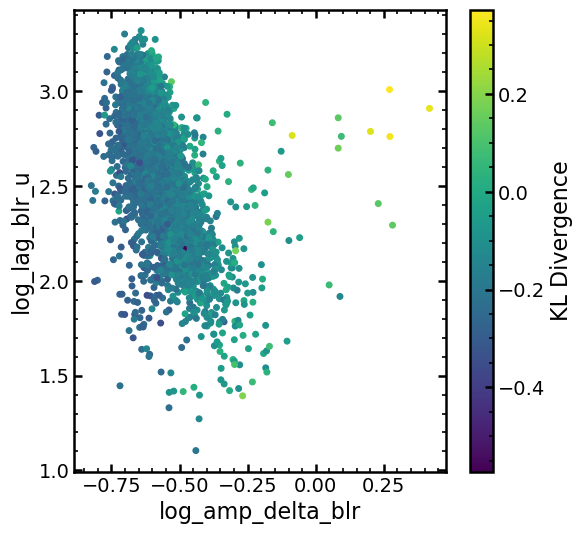

KL values for band g:


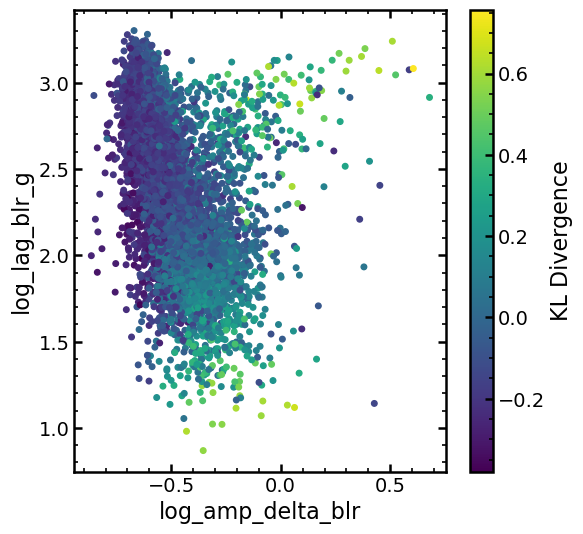

KL values for band r:


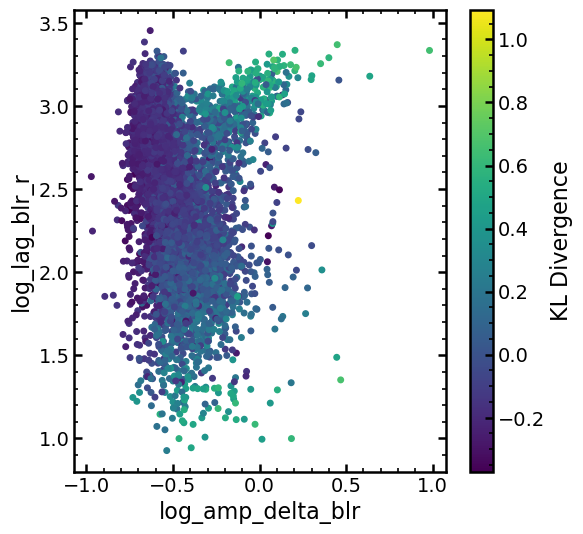

KL values for band i:


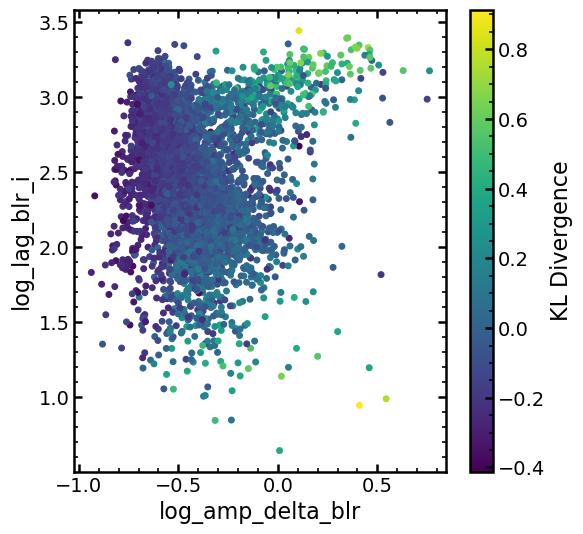

In [84]:
import matplotlib.pyplot as plt

for band in bands:
    print(f"KL values for band {band}:")
    #frac_blr = df_agn[f'log_amp_delta_blr_{band}']
    plt.scatter(df_agn[f"log_amp_delta_blr_{band}"], df_agn[f"log_lag_blr_{band}"], c=np.log(1+df_agn[f'kl_{band}']));
    plt.xlabel("log_amp_delta_blr")
    plt.ylabel(f"log_lag_blr_{band}")
    plt.colorbar(label='KL Divergence')
    plt.show()

In [85]:
np.log10(5000.0)

np.float64(3.6989700043360187)

KL values for band u:
KL values for band g:
KL values for band r:
KL values for band i:


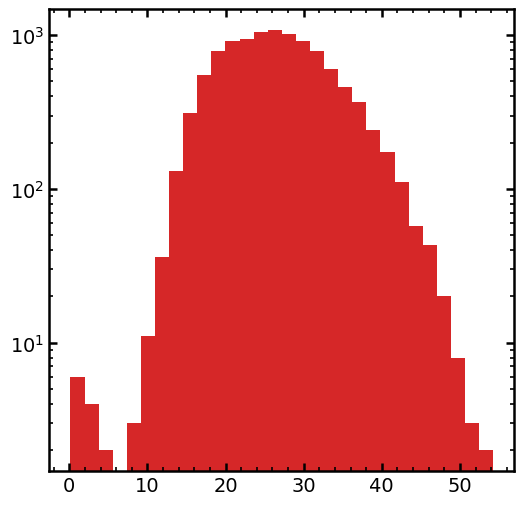

In [86]:
for band in ['u', 'g', 'r', 'i']:
    print(f"KL values for band {band}:")
    plt.hist(df_agn[f"lag0"], bins=30, log=True);

KL values for band u:
[-0.12139661 -0.1835463  -0.15544063 ... -0.20477814 -0.16991982
 -0.15030095]
KL values for band g:
[-0.14830655 -0.13781788 -0.21435347 ... -0.04592135 -0.06957274
 -0.07037591]
KL values for band r:
[-0.00849401 -0.14425639 -0.16565798 ... -0.16186583 -0.10068468
 -0.09602111]
KL values for band i:
[-0.23796717 -0.16570693 -0.09288813 ... -0.03636072 -0.14987004
 -0.10883174]


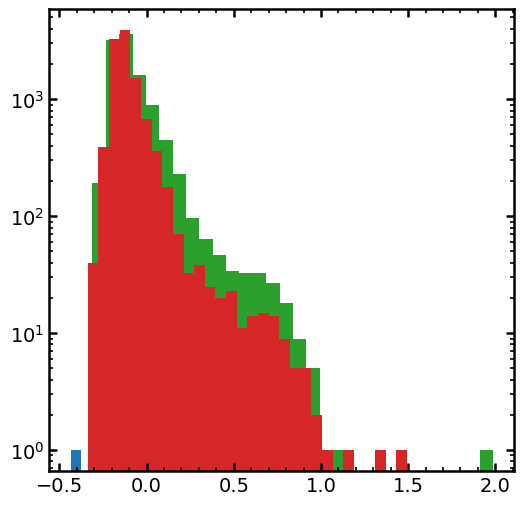

In [87]:
for band in ['u', 'g', 'r', 'i']:
    print(f"KL values for band {band}:")
    print(df_agn[f'kl_{band}'].dropna().values) 
    plt.hist(df_agn[f"kl_{band}"], bins=30, log=True);

In [88]:
bands = ['u', 'g', 'r', 'i']

from collections import OrderedDict

def sdss_broad_lines_by_band(z):
    """
    Return a dict mapping each SDSS band to the name of a broad line
    whose observed wavelength falls inside that band's (approximate) range
    at redshift z. If none, returns "none" for that band.

    Notes:
    - Filter edges are approximated as simple top-hats (Å).
    - Lines are checked in priority order; if multiple lines land in a band,
      the first match is returned.
    """

    # --- approximate SDSS bandpass ranges (Å); simple top-hat model ---
    bands = {
        "u": (3000.0, 4000.0),
        "g": (4000.0, 5500.0),
        "r": (5500.0, 7000.0),
        "i": (7000.0, 8500.0),
        #"z": (8500.0, 10000.0),
    }

    # --- common broad lines (rest Å), in priority order ---
    lines = OrderedDict([
        ("Lyα 1216", 1215.67),
        #("N V 1240", 1240.81),
        #("Si IV+O IV] 1400", 1397.0),
        ("C IV 1549", 1549.0),
        #("He II 1640", 1640.0),
        ("C III] 1909", 1908.73),
        ("Mg II 2798", 2798.0),
        #("Hγ 4340", 4340.47),
        ("Hβ 4861", 4861.33),
        ("Hα 6563", 6562.80),
    ])

    out = {}
    for band, (lo, hi) in bands.items():
        hit = "none"
        for name, lam0 in lines.items():
            lam_obs = lam0 * (1.0 + z)
            if lo + 0 <= lam_obs <= hi - 0:
                hit = name
                break
        out[band] = hit
    return out

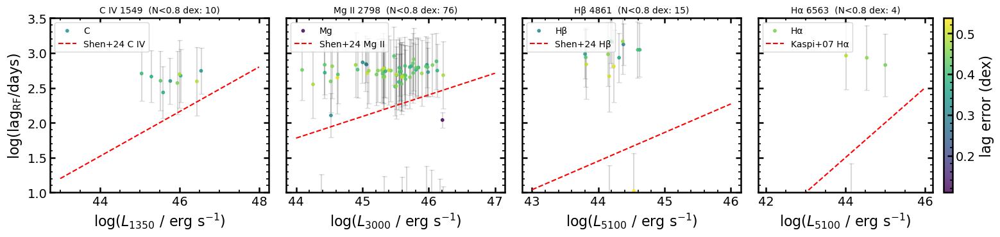

In [96]:
import matplotlib.pyplot as plt
import numpy as np
bands = ['u', 'g', 'r', 'i',]
# Inputs expected:
# - df_agn: pandas DataFrame with columns like:
#   'z', 'LOGL1350', 'LOGL3000', 'LOGL5100',
#   and per-band lag columns: 'log_lag_blr_u', 'log_lag_blr_g', ... and *_err, *_rhat, *_ess (optional)
# - sdss_broad_lines_by_band(z): function returning a dict mapping band -> line string (e.g., {"g": "Mg II 2798", ...})

broad_lines = ["C IV 1549", "Mg II 2798", "Hβ 4861", "Hα 6563"]
conti_lam   = [1350,        3000,        5100,       5100]

# Helper: find the band that carries a given line label inside a {band: line} mapping; return None if not found
def band_for_line(line_map, target_line):
    for b, l in line_map.items():
        if l == target_line:
            return b
    return None

fig, axes = plt.subplots(1, len(broad_lines), figsize=(4 * len(broad_lines), 4), sharey=True)

# Build per-object line maps
lines_by_obj = [sdss_broad_lines_by_band(z) for z in df_agn['z']]

all_logl, all_lag, all_lag_err, all_panel = [], [], [], []

for i, line in enumerate(broad_lines):
    # Objects where this line appears in the map
    mask = np.array([
        isinstance(d, dict) and (line in d.values()) 
        for d in lines_by_obj
    ])

    # Positions (not labels!)
    idxs = np.flatnonzero(mask)

    # Bands for this line per object; keep only those with a found band
    bands_for_line = [band_for_line(lines_by_obj[j], line) for j in idxs]
    good = np.array([b is not None for b in bands_for_line])
    if not np.any(good):
        # No data for this panel; continue gracefully
        axes[i].set_title(f'{line}  (N<0.8 dex: 0)', fontsize=10)
        axes[i].set_xlabel(rf'$\log( L_{{{conti_lam[i]}}} \ /\ \mathrm{{erg}} \ \mathrm{{s}}^{{-1}} )$')
        if i == 0:
            axes[i].set_ylabel(r'$\log(\mathrm{lag}_{\mathrm{RF}} / \mathrm{days})$')
        #axes[i].set_ylim(0, 3.5)
        continue

    idxs = idxs[good]
    bands_for_line = [b for b, g in zip(bands_for_line, good) if g]

    # Scalars per object (use .iloc for positional indexing!)
    z     = df_agn['z'].to_numpy()[idxs]
    logl  = df_agn[f'LOGL{conti_lam[i]}'].to_numpy()[idxs]

    # Per-row, per-band columns via positional indexing, robust to missing rhat/ess columns
    lag = np.array(
        [df_agn.iloc[j][f'log_lag_blr_{b}'] for j, b in zip(idxs, bands_for_line)],
        dtype=float
    )
    lag_err = np.array(
        [df_agn.iloc[j][f'log_lag_blr_{b}_err'] for j, b in zip(idxs, bands_for_line)],
        dtype=float
    )
    lag -= np.log10(1 + z)  # Convert to rest-frame lag here
    kl = np.array(
        [df_agn.iloc[j].get(f'kl_{b}', np.nan) for j, b in zip(idxs, bands_for_line)],
        dtype=float
    )
    amp_delta = np.array(
        [df_agn.iloc[j].get(f'log_amp_delta_blr_{b}', np.nan) for j, b in zip(idxs, bands_for_line)],
        dtype=float
    )

    # Basic quality mask (you can uncomment the rhat/ess thresholds if you wish)
    m2 = (logl > 0) & np.isfinite(lag) & np.isfinite(lag_err) & np.isfinite(z) & (kl > 0.5) #& (amp_delta > 0.0)

    all_logl.append(logl[m2])
    # Convert to rest-frame lag: log(tau_obs) - log(1+z) = log(tau_rf)
    all_lag.append(lag[m2])
    all_lag_err.append(lag_err[m2])
    all_panel.append(np.full(np.sum(m2), i, dtype=int))

# Concatenate across panels (guard empty)
if len(all_logl) == 0 or sum(map(len, all_logl)) == 0:
    # Nothing to plot — still return empty panels with axes formatting
    for i, line in enumerate(broad_lines):
        axes[i].set_title(f'{line}  (N<0.8 dex: 0)', fontsize=10)
        axes[i].set_xlabel(rf'$\log( L_{{{conti_lam[i]}}} \ /\ \mathrm{{erg}} \ \mathrm{{s}}^{{-1}} )$')
        if i == 0:
            axes[i].set_ylabel(r'$\log(\mathrm{lag}_{\mathrm{RF}} / \mathrm{days})$')
        #axes[i].set_ylim(0, 3.5)
    plt.tight_layout()
    plt.show()
else:
    all_logl    = np.concatenate(all_logl)
    all_lag     = np.concatenate(all_lag)
    all_lag_err = np.concatenate(all_lag_err)
    all_panel   = np.concatenate(all_panel)

    # Color scale based on lag error range (fallback if all NaN)
# Observed-frame band edges (Å)

    if np.all(~np.isfinite(all_lag_err)):
        vmin, vmax = 0.0, 1.0
    else:
        vmin, vmax = np.nanmin(all_lag_err), np.nanmax(all_lag_err)

    scs = []
    for i, line in enumerate(broad_lines):
        idx = (all_panel == i)
        keep = idx & np.isfinite(all_logl) & np.isfinite(all_lag) & np.isfinite(all_lag_err) #& (all_lag_err < 0.5)
        Ni = int(np.sum(keep))

        sc = axes[i].scatter(
            all_logl[keep], all_lag[keep],
            s=10, alpha=0.8, c=all_lag_err[keep],
            cmap='viridis', vmin=vmin, vmax=vmax,
            label=f'{line.split()[0]}'
        )
        scs.append(sc)

        axes[i].errorbar(
            all_logl[keep], all_lag[keep], yerr=all_lag_err[keep],
            linestyle='none', marker='none', alpha=0.15, color='k', zorder=-1
        )

        # Reference R–L relations (quick-and-dirty guide lines)
        if broad_lines[i] == "Hα 6563":
            xs = [42, 46]
            ys = [1.5 + 0.5 * (x - 44) for x in xs]
            axes[i].plot(xs, ys, 'r--', label='Kaspi+07 Hα')
        elif broad_lines[i] == "Hβ 4861":
            xs = [43, 46]
            ys = [1.45 + 0.41 * (x - 44) for x in xs] # Shen
            axes[i].plot(xs, ys, 'r--', label='Shen+24 Hβ')
        elif broad_lines[i] == "Mg II 2798":
            xs = [44, 47]
            ys = [2.09 + 0.31 * (x - 45) for x in xs] # Shen
            axes[i].plot(xs, ys, 'r--', label='Shen+24 Mg II')
        elif broad_lines[i] == "C IV 1549":
            xs = [43, 48]
            ys = [1.84 + 0.32 * (x - 45) for x in xs]
            axes[i].plot(xs, ys, 'r--', label='Shen+24 C IV')

        axes[i].legend(loc='upper left', fontsize=10)
        axes[i].set_title(f'{line}  (N<0.8 dex: {Ni})', fontsize=10)
        axes[i].set_xlabel(rf'$\log( L_{{{conti_lam[i]}}} \ /\ \mathrm{{erg}} \ \mathrm{{s}}^{{-1}} )$')
        if i == 0:
            axes[i].set_ylabel(r'$\log(\mathrm{{lag}}_{{\mathrm{{RF}}}} / \mathrm{{days}})$')
        axes[i].set_ylim(1.0, 3.5)

        # Only add colorbar to the rightmost panel
        if i == len(broad_lines) - 1 and Ni > 0:
            cbar = fig.colorbar(scs[i], ax=axes[i], label='lag error (dex)')


    plt.tight_layout()
    plt.show()


In [90]:
df_agn

,object_id,LOGL5100,LOGL5100_ERR,LOGLBOL,LOGLBOL_ERR,alpha_agn,alpha_agn_acf,alpha_agn_err,alpha_agn_ess,alpha_agn_per_chain_variance,...,dm_red_err,log_reddening_integral,log_conti_a_0,alpha_nu,alpha_nu_err,kl_u,kl_g,kl_r,kl_i,kl_z
0,1446436,0.000000,-1.000000,46.106453,0.010754,-1.520148,"[1.0, 0.016683227313473138, 0.0336658737691982...",0.279117,726.811399,"[0.07395039608473553, 0.0847721542091781, 0.09...",...,0.029114,NaN,-9.0,-1.288679,0.006126,NaN,NaN,-0.008494,-0.237967,NaN
1,1391164,0.000000,-1.000000,45.739251,0.006004,-1.518897,"[1.0, -0.12620071086702972, -0.044494010987899...",0.301505,800.000000,"[0.09308506083384359, 0.10788100040546007, 0.1...",...,0.025460,NaN,-9.0,-0.480687,0.012543,-0.121397,-0.148307,-0.144256,-0.165707,NaN
3,1393218,0.000000,-1.000000,46.390891,0.013278,-1.517803,"[1.0000000000000002, -0.020336533023105133, -0...",0.302495,800.000000,"[0.07409588272268039, 0.10489452127185042, 0.1...",...,0.037602,NaN,-9.0,-0.567935,0.014052,NaN,NaN,-0.165658,-0.092888,NaN
4,1442749,0.000000,-1.000000,45.544206,0.005787,-1.497540,"[1.0, -0.11011445416114934, 0.0942609829726324...",0.295610,800.000000,"[0.08803733708433487, 0.10783058416838698, 0.0...",...,0.038956,NaN,-9.0,-1.209684,0.012263,-0.183546,-0.137818,-0.067349,0.050089,NaN
5,1439445,0.000000,-1.000000,46.547468,0.002767,-1.523372,"[1.0, -0.02846479364568518, 0.0213550309799218...",0.302108,800.000000,"[0.09246190461184435, 0.08941785228512288, 0.1...",...,0.056767,NaN,-9.0,-0.764414,0.003949,NaN,NaN,-0.105823,-0.192043,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13044,1464912,0.000000,-1.000000,46.362922,0.003617,-1.512401,"[1.0, 0.07483870281246992, 0.02034579511232548...",0.321127,672.060515,"[0.09980605330616522, 0.08888430841917158, 0.1...",...,0.036644,NaN,-9.0,-0.647613,0.005781,NaN,NaN,-0.154123,-0.157691,NaN
13045,1414544,0.000000,-1.000000,46.081353,0.007889,-1.529249,"[0.9999999999999999, -0.06100855137614332, 0.1...",0.306050,612.371135,"[0.08956012833007476, 0.09647031161644971, 0.0...",...,0.051667,NaN,-9.0,-0.504360,0.028889,NaN,-0.215914,-0.027831,-0.189149,NaN
13046,1448406,0.000000,-1.000000,46.328272,0.002311,-1.502444,"[1.0, -0.06724054819364067, 0.0482147690534417...",0.315470,800.000000,"[0.10658836372308239, 0.09810033630336686, 0.1...",...,0.030876,NaN,-9.0,-0.632820,0.004242,-0.204778,-0.045921,-0.161866,-0.036361,NaN
13048,1450952,44.353996,0.018098,45.320607,0.018098,-1.494673,"[1.0, -0.19875740337135123, 0.0563075035041733...",0.308544,800.000000,"[0.0940600903257668, 0.09146183468244064, 0.10...",...,0.037099,NaN,-9.0,-0.862189,0.019764,-0.169920,-0.069573,-0.100685,-0.149870,NaN


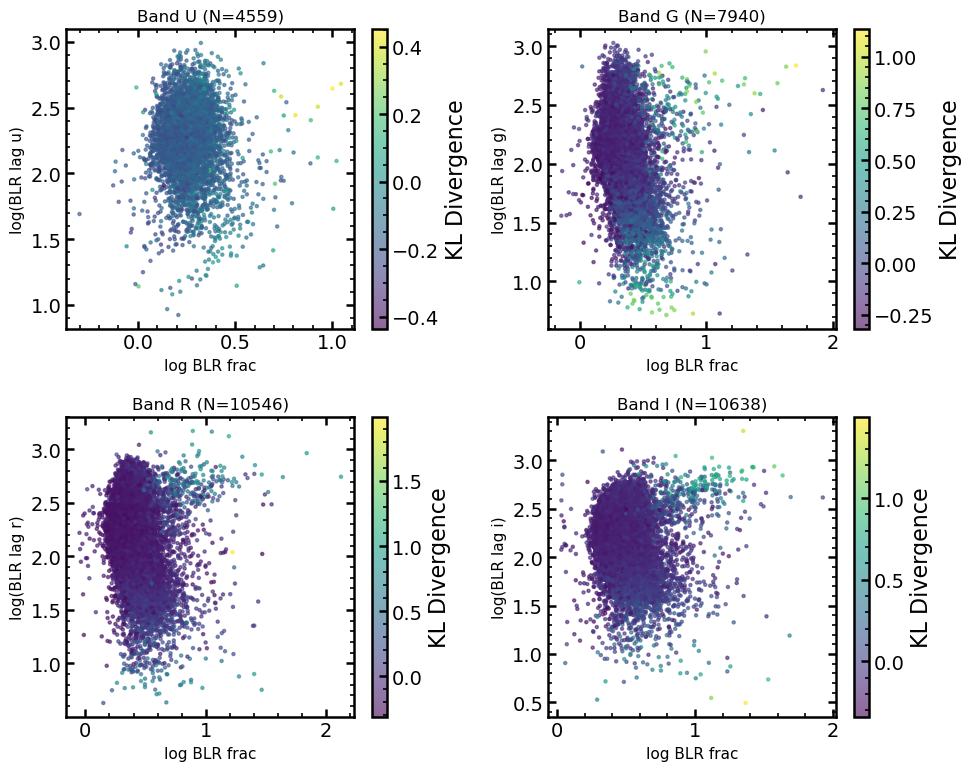

In [91]:
# Create a figure with subplots for each band
fig, axes = plt.subplots(2, 2, figsize=(10, 8))
axes = axes.flatten()

for idx, band in enumerate(['u', 'g', 'r', 'i']):
    ax = axes[idx]
    
    # Get data for this band
    amp_col = f'log_amp_delta_blr_{band}'
    lag_col = f'log_lag_blr_{band}'

    z = df_agn['z'].values
    
    # Filter out NaN values
    mask = df_agn[amp_col].notna() & df_agn[lag_col].notna()
    
    amp_vals = df_agn.loc[mask, amp_col].values
    amp_cont_vals = df_agn.loc[mask, f'log_sigma_band_{band}'].values
    sigma0_vals = df_agn.loc[mask, f'log_sigma0'].values
    lag_vals = df_agn.loc[mask, lag_col].values - np.log10(1 + z[mask])  # Convert to rest-frame lag
    kl_vals = df_agn.loc[mask, f'kl_{band}'].values

    frac_amp = (10**(sigma0_vals) + 10**(amp_vals)) / 10**(amp_cont_vals)
    
    # Scatter plot
    sc = ax.scatter(np.log10(frac_amp) , lag_vals, alpha=0.6, s=5, c=kl_vals, cmap='viridis')
    ax.set_xlabel('log BLR frac', fontsize=11)
    ax.set_ylabel(f'log(BLR lag {band})', fontsize=11)
    ax.set_title(f'Band {band.upper()} (N={len(kl_vals)})', fontsize=12)
    plt.colorbar(sc, ax=ax, label='KL Divergence')
plt.tight_layout()
plt.show()

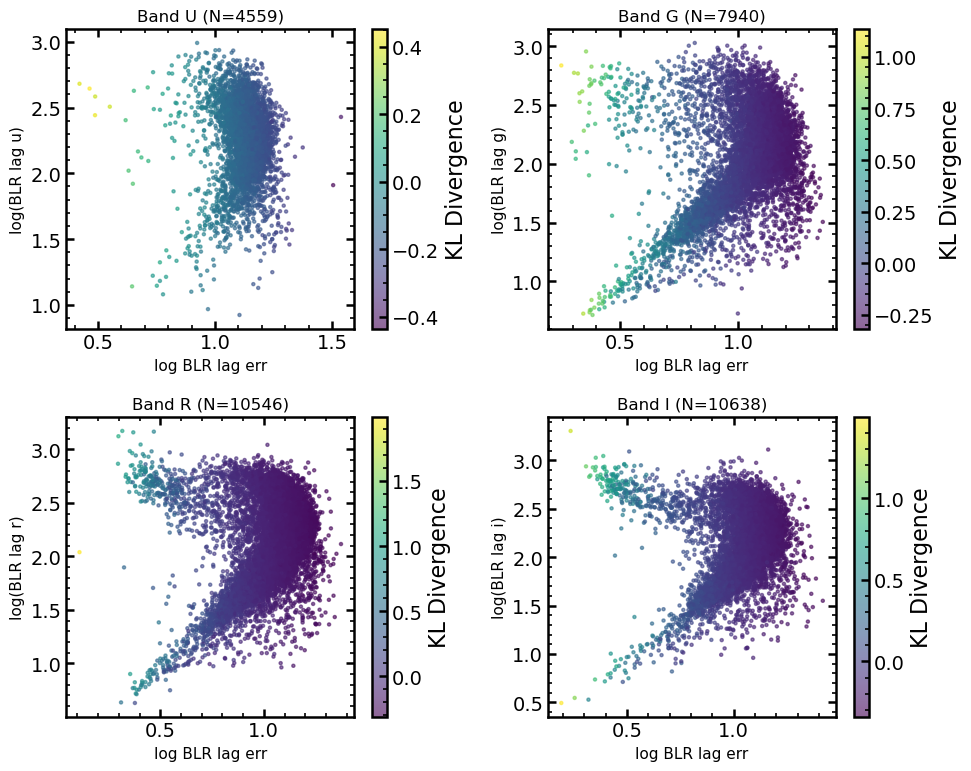

In [92]:
# Create a figure with subplots for each band
fig, axes = plt.subplots(2, 2, figsize=(10, 8))
axes = axes.flatten()

for idx, band in enumerate(['u', 'g', 'r', 'i']):
    ax = axes[idx]
    
    # Get data for this band
    amp_col = f'log_amp_delta_blr_{band}'
    lag_col = f'log_lag_blr_{band}'
    lag_err_col = f'log_lag_blr_{band}_err'

    z = df_agn['z'].values
    
    # Filter out NaN values
    mask = df_agn[amp_col].notna() & df_agn[lag_col].notna()
    
    amp_vals = df_agn.loc[mask, amp_col].values
    amp_cont_vals = df_agn.loc[mask, f'log_sigma_band_{band}'].values
    sigma0_vals = df_agn.loc[mask, f'log_sigma0'].values
    lag_vals = df_agn.loc[mask, lag_col].values - np.log10(1 + z[mask])  # Convert to rest-frame lag
    lag_err_vals = df_agn.loc[mask, lag_err_col].values
    kl_vals = df_agn.loc[mask, f'kl_{band}'].values

    frac_amp = (10**(sigma0_vals) + 10**(amp_vals)) / 10**(amp_cont_vals)
    
    # Scatter plot
    sc = ax.scatter(lag_err_vals , lag_vals, alpha=0.6, s=5, c=kl_vals, cmap='viridis')
    ax.set_xlabel('log BLR lag err', fontsize=11)
    ax.set_ylabel(f'log(BLR lag {band})', fontsize=11)
    ax.set_title(f'Band {band.upper()} (N={len(kl_vals)})', fontsize=12)
    plt.colorbar(sc, ax=ax, label='KL Divergence')
plt.tight_layout()
plt.show()

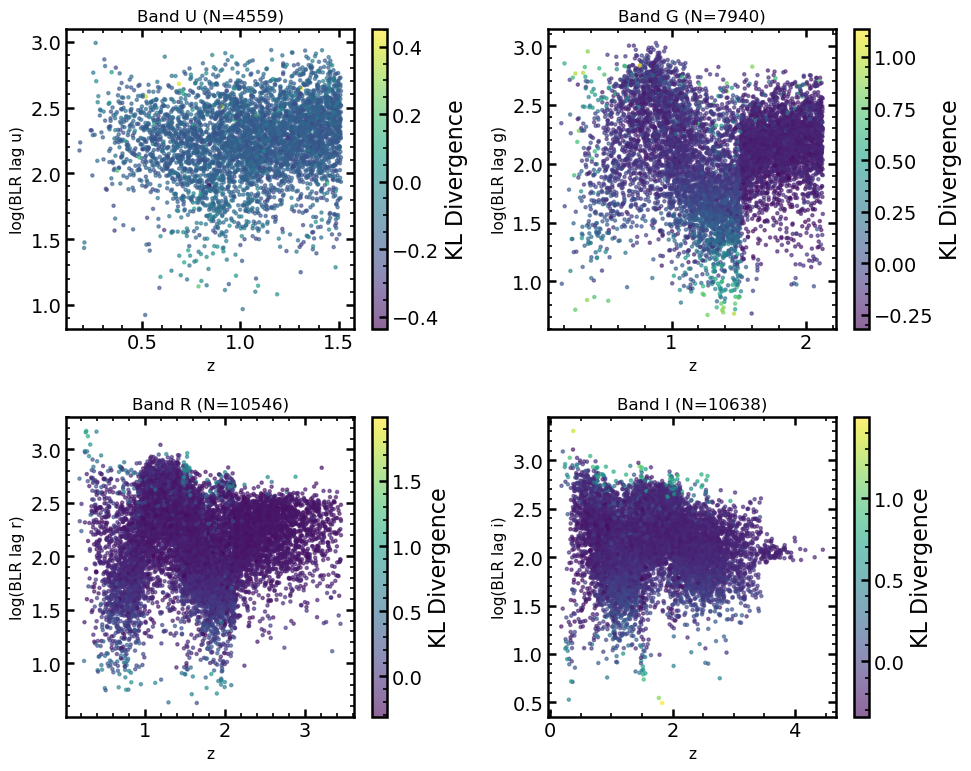

In [93]:
# Create a figure with subplots for each band
fig, axes = plt.subplots(2, 2, figsize=(10, 8))
axes = axes.flatten()

for idx, band in enumerate(['u', 'g', 'r', 'i']):
    ax = axes[idx]
    
    # Get data for this band
    amp_col = f'log_amp_delta_blr_{band}'
    lag_col = f'log_lag_blr_{band}'
    lag_err_col = f'log_lag_blr_{band}_err'

    z = df_agn['z'].values
    
    # Filter out NaN values
    mask = df_agn[amp_col].notna() & df_agn[lag_col].notna()
    
    amp_vals = df_agn.loc[mask, amp_col].values
    amp_cont_vals = df_agn.loc[mask, f'log_sigma_band_{band}'].values
    sigma0_vals = df_agn.loc[mask, f'log_sigma0'].values
    lag_vals = df_agn.loc[mask, lag_col].values - np.log10(1 + z[mask])  # Convert to rest-frame lag
    lag_err_vals = df_agn.loc[mask, lag_err_col].values
    kl_vals = df_agn.loc[mask, f'kl_{band}'].values
    z = z[mask]

    frac_amp = (10**(sigma0_vals) + 10**(amp_vals)) / 10**(amp_cont_vals)
    
    # Scatter plot
    sc = ax.scatter(z , lag_vals, alpha=0.6, s=5, c=kl_vals, cmap='viridis')
    ax.set_xlabel('z', fontsize=11)
    ax.set_ylabel(f'log(BLR lag {band})', fontsize=11)
    ax.set_title(f'Band {band.upper()} (N={len(kl_vals)})', fontsize=12)
    plt.colorbar(sc, ax=ax, label='KL Divergence')
plt.tight_layout()
plt.show()

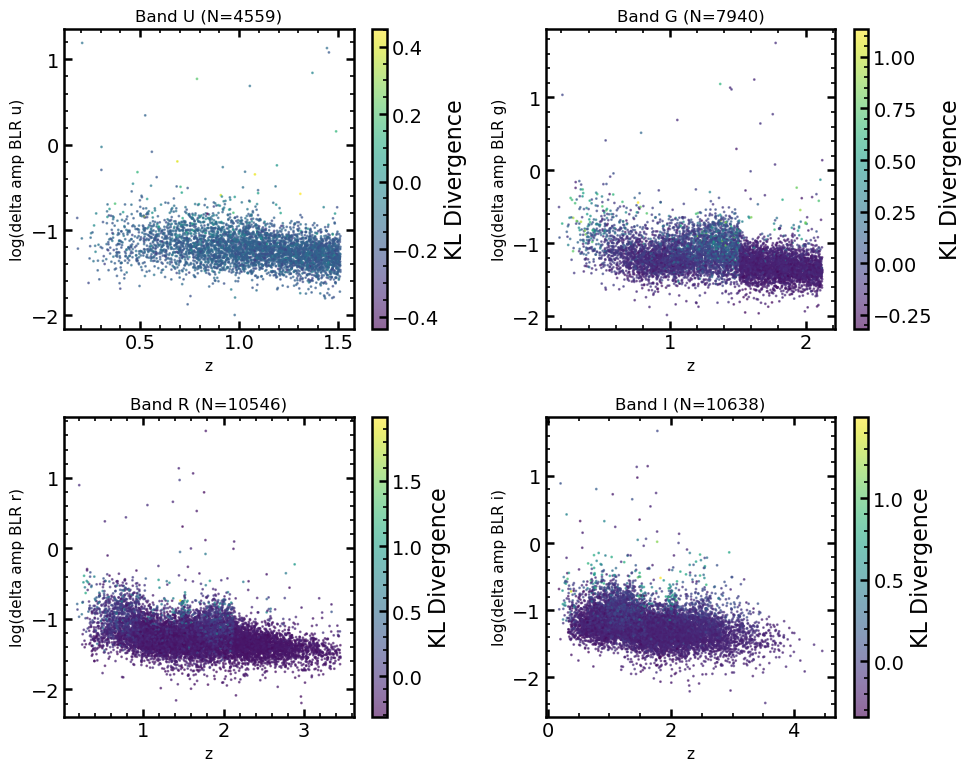

In [104]:
# Create a figure with subplots for each band
fig, axes = plt.subplots(2, 2, figsize=(10, 8))
axes = axes.flatten()

for idx, band in enumerate(['u', 'g', 'r', 'i']):
    ax = axes[idx]
    
    # Get data for this band
    amp_col = f'log_amp_delta_blr_{band}'
    lag_col = f'log_lag_blr_{band}'
    lag_err_col = f'log_lag_blr_{band}_err'

    z = df_agn['z'].values
    
    # Filter out NaN values
    mask = df_agn[amp_col].notna() & df_agn[lag_col].notna()
    
    amp_vals = df_agn.loc[mask, amp_col].values
    amp_cont_vals = df_agn.loc[mask, f'log_sigma_band_{band}'].values
    sigma0_vals = df_agn.loc[mask, f'log_sigma0'].values
    lag_vals = df_agn.loc[mask, lag_col].values - np.log10(1 + z[mask])  # Convert to rest-frame lag
    lag_err_vals = df_agn.loc[mask, lag_err_col].values
    kl_vals = df_agn.loc[mask, f'kl_{band}'].values
    z = z[mask]

    frac_amp = (10**(sigma0_vals) + 10**(amp_vals)) / 10**(amp_cont_vals)
    
    # Scatter plot
    sc = ax.scatter(z , amp_vals+sigma0_vals, alpha=0.6, s=1, c=kl_vals, cmap='viridis')
    ax.set_xlabel('z', fontsize=11)
    ax.set_ylabel(f'log(delta amp BLR {band})', fontsize=11)
    ax.set_title(f'Band {band.upper()} (N={len(kl_vals)})', fontsize=12)
    plt.colorbar(sc, ax=ax, label='KL Divergence')
plt.tight_layout()
plt.show()

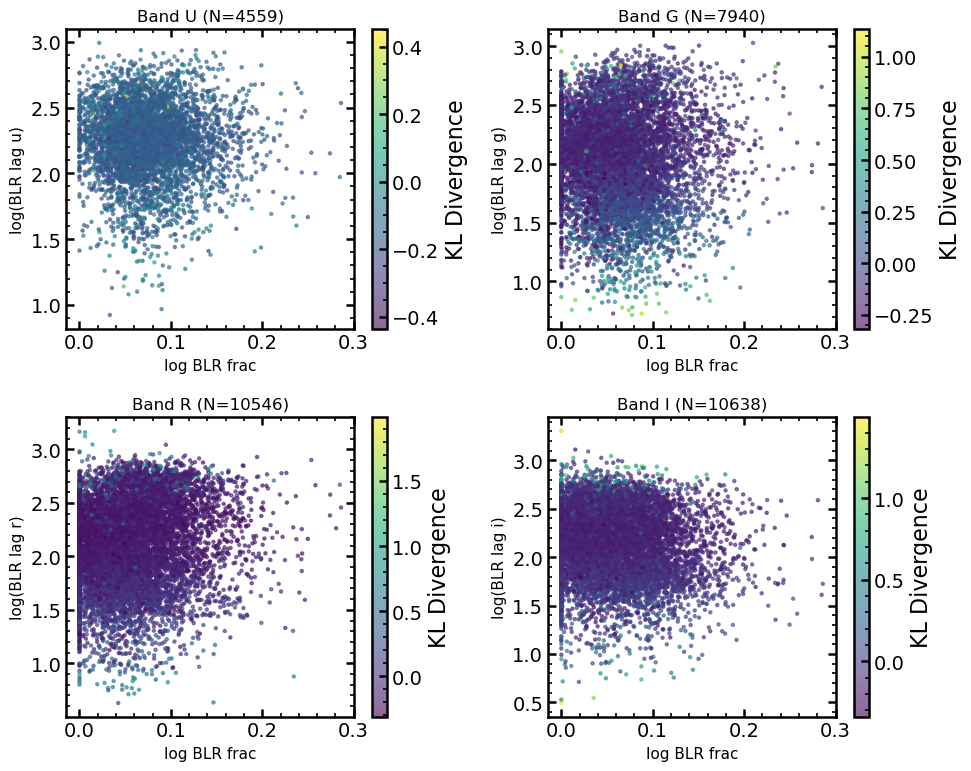

In [95]:
# Create a figure with subplots for each band
fig, axes = plt.subplots(2, 2, figsize=(10, 8))
axes = axes.flatten()

for idx, band in enumerate(['u', 'g', 'r', 'i']):
    ax = axes[idx]
    
    # Get data for this band
    amp_col = f'log_amp_delta_blr_{band}'
    lag_col = f'log_lag_blr_{band}'

    z = df_agn['z'].values
    
    # Filter out NaN values
    mask = df_agn[amp_col].notna() & df_agn[lag_col].notna()
    
    amp_vals = df_agn.loc[mask, amp_col].values
    amp_cont_vals = df_agn.loc[mask, f'log_sigma_band_{band}'].values
    sigma0_vals = df_agn.loc[mask, f'log_sigma0'].values
    lag_vals = df_agn.loc[mask, lag_col].values - np.log10(1 + z[mask])  # Convert to rest-frame lag
    kl_vals = df_agn.loc[mask, f'kl_{band}'].values
    iron_frac_vals = df_agn.loc[mask, 'iron_frac'].values

    frac_amp = (10**(sigma0_vals) + 10**(amp_vals)) / 10**(amp_cont_vals)
    
    # Scatter plot
    sc = ax.scatter(np.log10(iron_frac_vals) , lag_vals, alpha=0.6, s=5, c=kl_vals, cmap='viridis')
    ax.set_xlabel('log BLR frac', fontsize=11)
    ax.set_ylabel(f'log(BLR lag {band})', fontsize=11)
    ax.set_title(f'Band {band.upper()} (N={len(kl_vals)})', fontsize=12)
    plt.colorbar(sc, ax=ax, label='KL Divergence')
plt.tight_layout()
plt.show()